# [IAPR][iapr]: Lab 1 ‒  Image segmentation


**Group ID:** 2

**Author 1 (sciper):** Linda Delacombaz (288415)  
**Author 2 (sciper):** Chiara Maria Matti (350647)   
**Author 3 (sciper):** Camille Delgrange (282250)   

**Release date:** 8.03.2023  
**Due date:** 24.03.2022 (11:59 pm)


## Important notes

The lab assignments are designed to teach practical implementation of the topics presented during class well as
preparation for the final project, which is a practical project which ties together the topics of the course.

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external
functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation
in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook <font color='red'> rerun </font>the notebook from scratch !**
`Kernel` > `Restart & Run All`

We will not rerun the notebook for you.

[iapr]: https://github.com/LTS5/iapr

In [2]:
# IMPORTS:

import tarfile
import os

# Import main libraries:
import skimage.io
import matplotlib.pyplot as plt
import numpy as np
import scipy as sc
%matplotlib inline

# Color conversion:
from skimage.color import rgb2hsv
from skimage.color import rgb2gray


# Thresholding:
from skimage import filters

from skimage.filters import threshold_otsu
from skimage.filters import threshold_multiotsu

# Morphological operations:
from skimage.morphology import disk 
from skimage.morphology import closing, opening
from skimage.morphology import remove_small_holes, remove_small_objects
from skimage.morphology import dilation

# Edge detection:
from skimage.restoration import denoise_nl_means, estimate_sigma
from skimage.metrics import peak_signal_noise_ratio


import matplotlib.patches as patches
from matplotlib.colors import LinearSegmentedColormap

# Import opencv:
import cv2

---
## 0. Extract relevant data
We first need to extract the `lab-01-data.tar.gz` archive.
To this end, we use the [tarfile] module from the Python standard library.

[tarfile]: https://docs.python.org/3.6/library/tarfile.html

In [3]:
data_base_path = os.path.join(os.pardir, 'data')
print(data_base_path)
data_folder = 'lab-01-data'
tar_path = os.path.join(data_base_path, data_folder + '.tar.gz')

if not os.path.exists(tar_path):
    raise Exception('Path to is not valid {}'.format(tar_path))
    
with tarfile.open(tar_path, mode='r:gz') as tar:
    tar.extractall(path=data_base_path)

..\data


---
## Part 1: Segmentation


### 1.0 Intro

In this exercise, you will be given two images. 

* `mucinous_adeno.jpg`: The image depicts a tissue sample from mucinous adenocarcinoma in colorectal cancer. The data is taken from the Cancer Genome Atlas (TCGA) which is an open-source database of different cancer types. Here you can see a tissue taken from a patient and stained using hematoxylin (purple) and eosin (pink) staining. The hematoxylin stains cell nuclei with a purplish blue, and the eosin stains the extracellular matrix and cytoplasm in pink.

* `mucinous_adeno_gt.jpg`: The second image is a coarse annotation of what is regarded as the so-called mucinous area. The mucinous area can be identified as a gray area tainted with purple. The presence of a large amount of mucin is a sign of a defect of normal epithelial cells that start to produce an unreasonable amount of mucin.


### 1.1 Tasks

You will be asked to extract the mucinous area using various approaches:

- [ ] Thresholding
- [ ] Morphology
- [ ] Region growing


### 1.1 Tissue image visualization

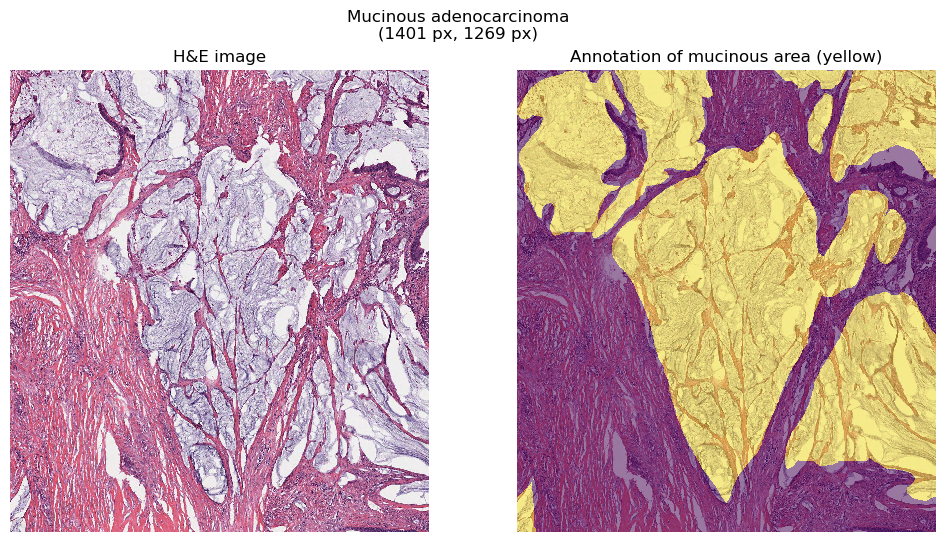

In [11]:
# Load images
path_to_image = os.path.join(data_base_path, data_folder, "mucinous_adeno.jpg")
path_to_gt = os.path.join(data_base_path, data_folder, "mucinous_adeno_gt.jpg")
adeno_img = skimage.io.imread(path_to_image)
adeno_gt = skimage.io.imread(path_to_gt) > 128

# Get size of the image in px
im_h, im_w, im_c = adeno_img.shape # im_c is the number of channels (3 for RGB)

# Display Tissue image
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

# Plot image with overlay
ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')
plt.suptitle("Mucinous adenocarcinoma\n({} px, {} px)".format(im_h, im_w))
plt.show()

---
### 1.2 Thresholding (4pts)
#### 1.2.1 RGB & Hue (1 pts)

Display the histogram for each channel (R, G, and B) as well as the histogram for the H (hue) channel. Note that you can use [rgb2hsv](https://scikit-image.org/docs/stable/api/skimage.color.html#skimage.color.rgb2hsv) to convert an RGB image to an HSV image and then extract the hue.

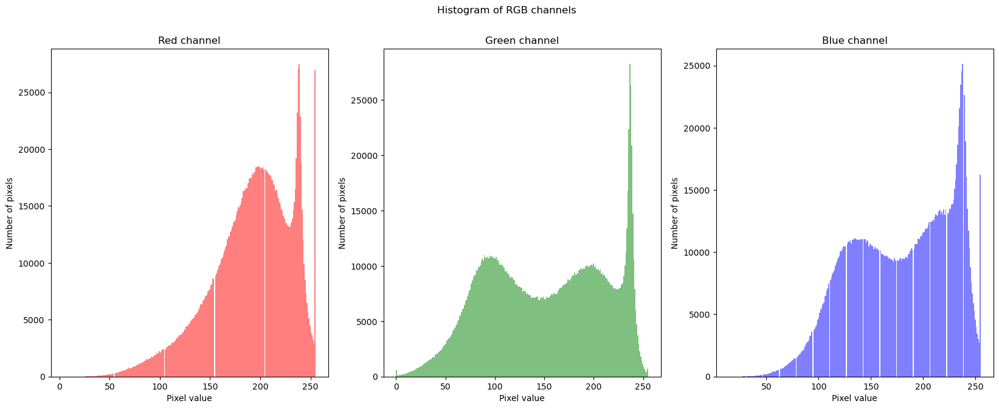

In [13]:
# Histogram of red, green and blue channel
fig, ax = plt.subplots(1, 3, figsize=(20, 7))

# Plot histogram of red channel
ax[0].hist(adeno_img[:, :, 0].flatten(), bins=256, color='r', alpha=0.5)
ax[0].set_title('Red channel')
ax[0].set_ylabel('Number of pixels')
ax[0].set_xlabel('Pixel value')

# Plot histogram of green channel
ax[1].hist(adeno_img[:, :, 1].flatten(), bins=256, color='g', alpha=0.5)
ax[1].set_title('Green channel')
ax[1].set_ylabel('Number of pixels')
ax[1].set_xlabel('Pixel value')

# Plot histogram of blue channel
ax[2].hist(adeno_img[:, :, 2].flatten(), bins=256, color='b', alpha=0.5)
ax[2].set_title('Blue channel')
ax[2].set_ylabel('Number of pixels')
ax[2].set_xlabel('Pixel value')

plt.suptitle("Histogram of RGB channels")
plt.show()

In [12]:
#extract hue channel
adeno_hsv = rgb2hsv(adeno_img) 
adeno_hue = adeno_hsv[:,:,0]

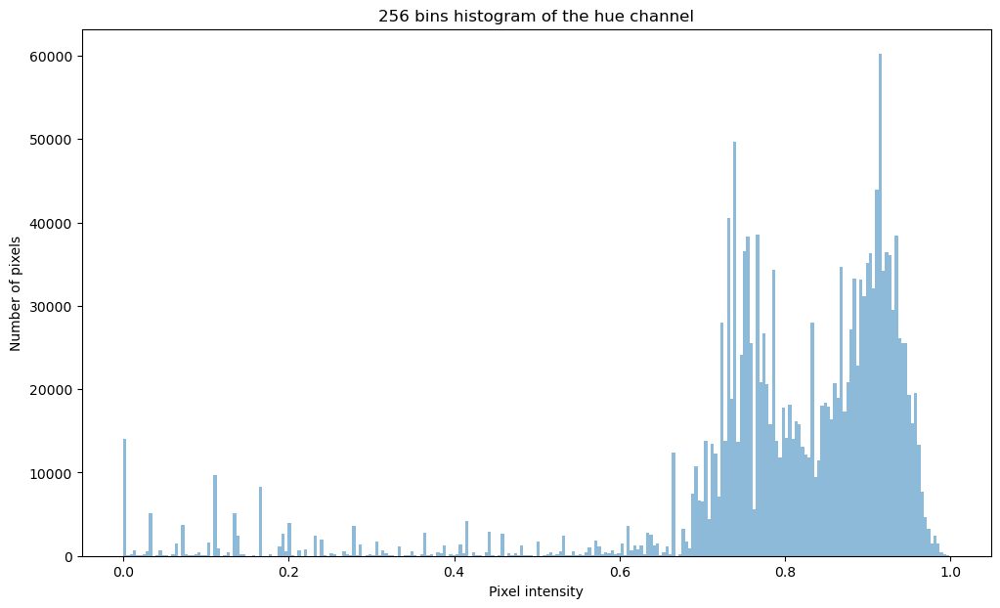

In [14]:
# Compute histogram of the hue channel

# Display histogram
plt.figure(figsize=(12, 7))
plt.hist(adeno_hsv[:,:,0].ravel(), bins= 256, alpha=0.5)
plt.xlabel('Pixel intensity')
plt.ylabel('Number of pixels')
plt.title('256 bins histogram of the hue channel')

plt.show()

#### 1.2.2 Apply Thresholding (2 pts)

For each histogram find the threshold(s) that work the best to isolate the mucinous area. Display the image after thresholding of each channel as well as the error between your prediction ($im$) and the annotations ($gt$) using the formula:

$$error = 1 - \left( \frac{1}{IJ} \sum_{i,j} im_{i,j} == gt_{i, j} \right)$$

Here, I and J are the dimensions of the image.

In [15]:
# for each channels find the threshold to isolate mucinous area

threshold_red = threshold_otsu(adeno_img[:,:,0])
threshold_green = threshold_otsu(adeno_img[:,:,1])
threshold_blue = threshold_otsu(adeno_img[:,:,2])
threshold_hue = threshold_otsu(adeno_hue)

print("Found automatic threshold t for the red channel = {}.".format(threshold_red))
print("Found automatic threshold t for the green channel = {}.".format(threshold_green))
print("Found automatic threshold t for the blue channel = {}.".format(threshold_blue))
print("Found automatic threshold t for the hue channel = {}.".format(threshold_hue))


Found automatic threshold t for the red channel = 181.
Found automatic threshold t for the green channel = 150.
Found automatic threshold t for the blue channel = 175.
Found automatic threshold t for the hue channel = 0.5130603608630953.


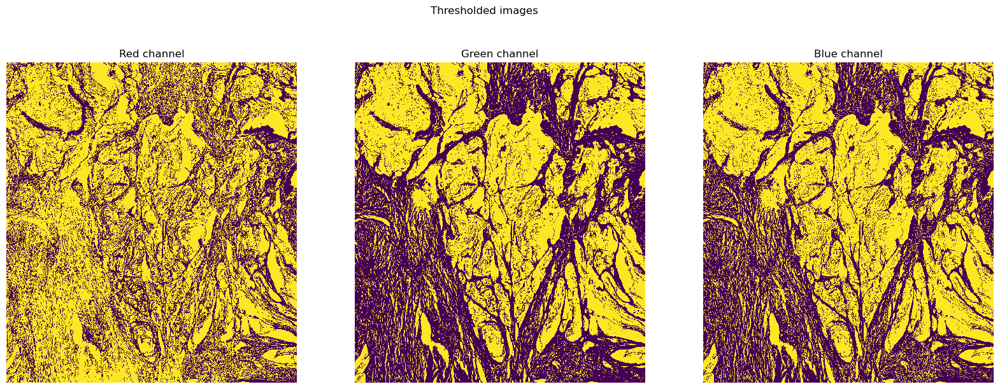

In [16]:
# Display thresholded images
fig, ax = plt.subplots(1, 3, figsize=(20, 7))

# Plot image for the red channel
ax[0].imshow(adeno_img[:,:,0] > threshold_red, interpolation='nearest')
ax[0].set_title('Red channel')
ax[0].axis('off')

# Plot image for the green channel
ax[1].imshow(adeno_img[:,:,1] > threshold_green, interpolation='nearest')
ax[1].set_title('Green channel')
ax[1].axis('off')

# Plot image for the blue channel
ax[2].imshow(adeno_img[:,:,2] > threshold_blue, interpolation='nearest')
ax[2].set_title('Blue channel')
ax[2].axis('off')

plt.suptitle("Thresholded images")
plt.show()

In [ ]:
# 246-195, 145, 177

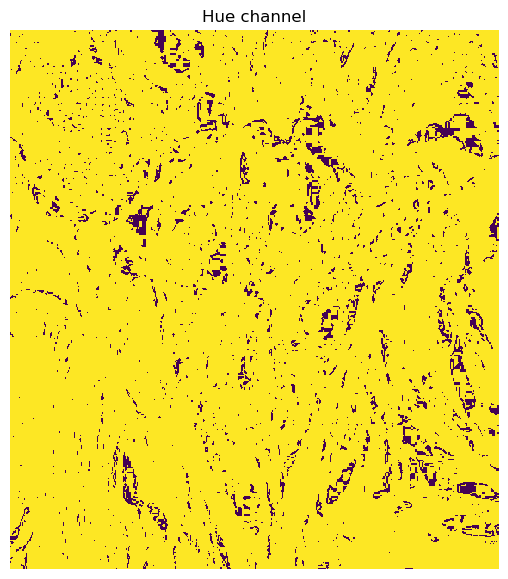

In [10]:
# Display thresholded image for the hue channel
plt.figure(figsize=(12, 7))
plt.imshow(adeno_hue > threshold_hue, interpolation='nearest')
plt.title('Hue channel')
plt.axis('off')
plt.show()

In [17]:
# Error function
def error_function(img, gt, threshold):
    # Compute the error function
    # Input:
    #   img: image to segment : numpy array of shape (im_h, im_w), by channel
    #   gt: ground truth
    # Output:
    #   error: error function value

    error = 1 - (np.sum((img > threshold )== gt))/(im_h*im_w)

    return error


In [18]:
error_red = error_function(adeno_img[:,:,0], adeno_gt, threshold_red)
error_green = error_function(adeno_img[:,:,1], adeno_gt, threshold_green)
error_blue = error_function(adeno_img[:,:,2], adeno_gt, threshold_blue)
error_hue = error_function(adeno_hue, adeno_gt, threshold_hue)

print("Error for the red channel = {}.".format(error_red))
print("Error for the green channel = {}.".format(error_green))
print("Error for the blue channel = {}.".format(error_blue))
print("Error for the hue channel = {}.".format(error_hue))


Error for the red channel = 0.4508133051422799.
Error for the green channel = 0.26312849821893514.
Error for the blue channel = 0.27391050746708556.
Error for the hue channel = 0.4935408626844835.


#### 1.2.3 Best Thresholding (1 pts)

Based on your previous findings, set the best threshold(s) and create the final mask as the variable `mask_thesholding`

In [19]:
#TODO: replace variable with your own threshold
mask_thesholding = np.zeros_like(adeno_gt)

In [20]:
# logical and for the threshold

In [21]:
mask_thesholding = adeno_img[:,:,1] > threshold_green

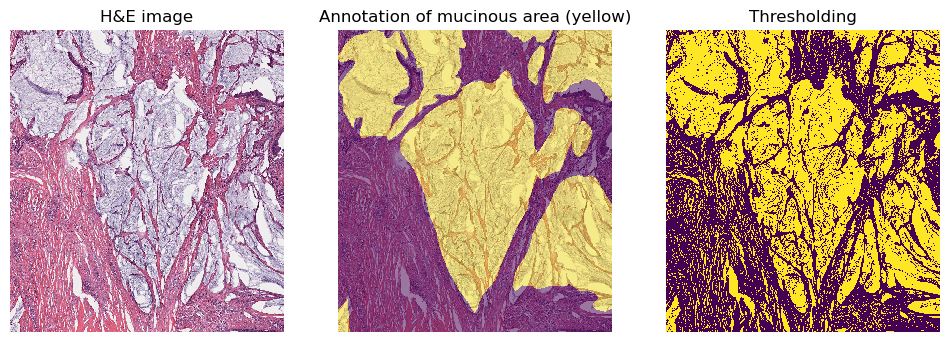

In [22]:
# Display MRI image
fig, ax = plt.subplots(1, 3, figsize=(12, 5))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')

ax[2].imshow(mask_thesholding, interpolation='nearest')
ax[2].imshow(mask_thesholding, alpha=0.5, interpolation='nearest')
ax[2].set_title('Thresholding')
ax[2].axis('off')

plt.show()

---

### 1.3 Morphology (5pts)

To proceed, use the best results of the previous model (namely `mask_thesholding`) as the starting point. In this exercise we will try to clean the mask using morphology.

* A (2pts): Try the following operation [closing](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing), [opening](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening) with [disk](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk) size of: $1, 2, 5, 10$. Comment on the quality of the results.

* B (2pts): Try the following operation [remove_small_holes](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_holes), [remove_small_objects](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_objects) with size of: $10, 50, 100, 500$. Comment on the quality of the results.

* C (1pts): Based on your previous results, can you find a combination of the functions that improve your results? Plot the best result along with the error rate. Save the mask as the variable `mask_morph`

## A

In [23]:
# clean the mask
sizes = [1, 2, 5, 10]

disks = [disk(size) for size in sizes] #disk(k) is a flat disk of radius k

In [24]:
closings = [closing(mask_thesholding, disk) for disk in disks]

openings = [opening(mask_thesholding, disk) for disk in disks]

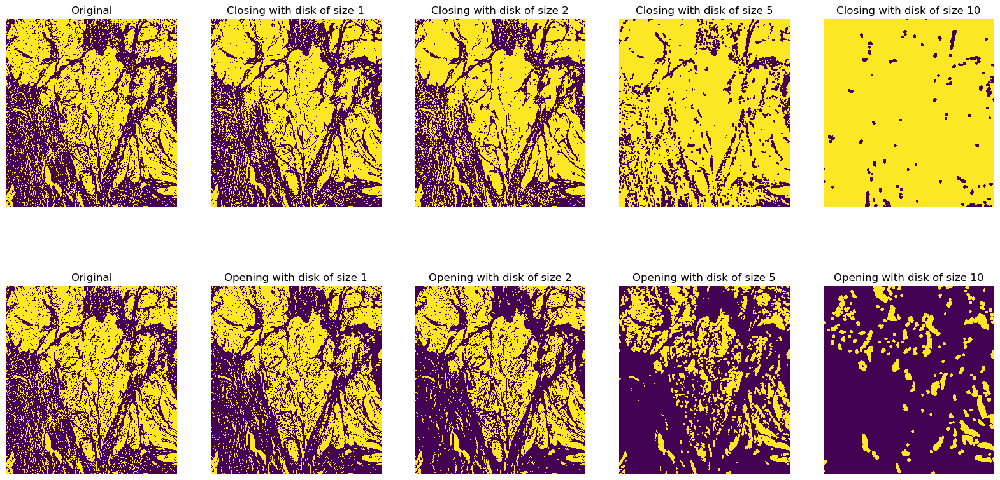

In [25]:
# Display results
fig, ax = plt.subplots(2, 5, figsize=(20, 10))

# Plot original image
ax[0, 0].imshow(mask_thesholding, interpolation='nearest')
ax[0, 0].set_title('Original')
ax[0, 0].axis('off')

ax[1, 0].imshow(mask_thesholding, interpolation='nearest')
ax[1, 0].set_title('Original')
ax[1, 0].axis('off')

# Plot closing
for i in range(4):
    ax[0, i+1].imshow(closings[i], interpolation='nearest')
    ax[0, i+1].set_title('Closing with disk of size {}'.format(sizes[i]))
    ax[0, i+1].axis('off')

# Plot opening
for i in range(4):
    ax[1, i+1].imshow(openings[i], interpolation='nearest')
    ax[1, i+1].set_title('Opening with disk of size {}'.format(sizes[i]))
    ax[1, i+1].axis('off')

plt.show()

COMMENTS TO BE DONE 

We can observe that the best closing is with the disk of size 2, and that the best opening disk's size is of size 1 or 2. (?)

Closing : dilate and erode (closes the holes)
Opening : erode and dilate 

## B

In [27]:
sizes_B = [10, 50, 100, 500]

#remove small holes of different sizes
holes = [remove_small_holes(mask_thesholding, size) for size in sizes_B]

#remove small objects of different sizes
objects = [remove_small_objects(mask_thesholding, size) for size in sizes_B]


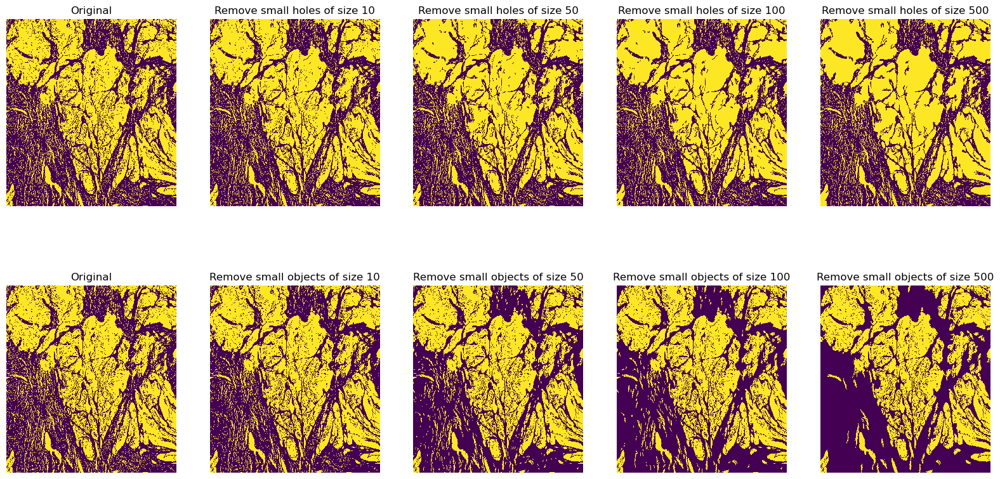

In [28]:
# Display results
fig, ax = plt.subplots(2, 5, figsize=(20, 10))

# Plot original image
ax[0, 0].imshow(mask_thesholding, interpolation='nearest')
ax[0, 0].set_title('Original')
ax[0, 0].axis('off')

ax[1, 0].imshow(mask_thesholding, interpolation='nearest')
ax[1, 0].set_title('Original')
ax[1, 0].axis('off')

# Plot remove small holes
for i in range(4):
    ax[0, i+1].imshow(holes[i], interpolation='nearest')
    ax[0, i+1].set_title('Remove small holes of size {}'.format(sizes_B[i]))
    ax[0, i+1].axis('off')

# Plot remove small objects
for i in range(4):
    ax[1, i+1].imshow(objects[i], interpolation='nearest')
    ax[1, i+1].set_title('Remove small objects of size {}'.format(sizes_B[i]))
    ax[1, i+1].axis('off')

plt.show()

COMMENTS TO BE DONE

We observe that when the small holes of size 100 are removed, it removes the majorities of the holes of the original picture.
The small objects when removed also shows good quality results when it is on obkects of size 100.

## C

Not sure of the combinations of functions here

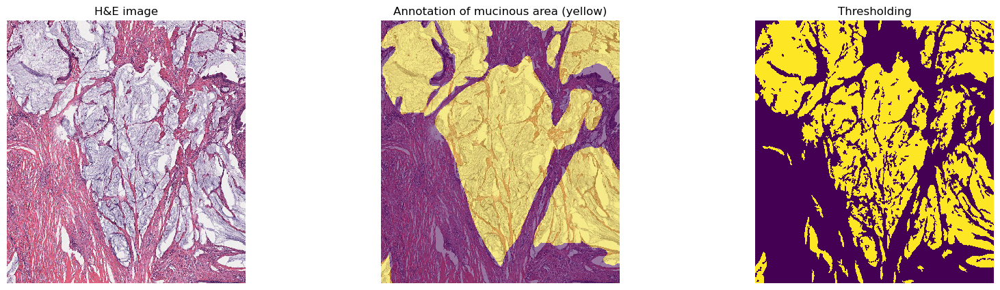

In [30]:
# combination of remove small holes of size 100 and remove small objects of size 100

mask_thesholding = opening(mask_thesholding, disk(2)) # this doesn't change much
mask_thesholding = closing(mask_thesholding, disk(2))
mask_thesholding = remove_small_holes(mask_thesholding, 100)
mask_thesholding = remove_small_objects(mask_thesholding, 500) # added now but unsure if it's good

# Display MRI image
fig, ax = plt.subplots(1, 3, figsize=(20, 5))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')

ax[2].imshow(mask_thesholding, interpolation='nearest')
ax[2].imshow(mask_thesholding, alpha=0.5, interpolation='nearest')
ax[2].set_title('Thresholding')
ax[2].axis('off')

plt.show()

In [29]:
#Display the error rate:
error_rate = error_function(mask_thesholding, adeno_gt, threshold_green)
print("Error rate = {}.".format(error_rate))

Error rate = 0.5305154654251804.


In [31]:
# TODO C
mask_morph = np.zeros_like(adeno_gt)

In [32]:
# Save the mask as the variable `mask_morph`:
mask_morph = mask_thesholding

---
### 1.4 Region growing (5pts)

In this exercise you will implement from scratch your own region growing algorithm. Choose one of the image channel (R/G/B/H) as the source image. You can use multiple seed point to achieve better results. Plot the best result along with the error rate. Save the mask as the variable `mask_region`.

In [112]:
# TODO
mask_region = np.zeros_like(adeno_gt)

In [282]:
# TO BE ADAPTED
def display_img(brain_im, rec=None):
    fig, ax = plt.subplots(1, len(brain_im), figsize=(6*len(brain_im), 6))
    if len(brain_im) > 1:
        for i in range(len(ax)):
            ax[i].imshow(brain_im[i], cmap='gray', vmin=0, vmax=255)
            ax[i].set_title('MRI brain image ({} px, {} px)'.format(*brain_im[i].shape))
            ax[i].axis('off')
            if ((rec != None) and (len(rec) > i)):
                start = rec[i][0]
                width = rec[i][1]
                height = rec[i][2]
                rect = patches.Rectangle(start, width, height, linewidth=2, edgecolor='r', facecolor='none')
                ax[i].add_patch(rect)
            if rec and i == len(rec):
                w = np.random.randint(low=0, high=brain_im[i].shape[0] - 10)
                h = np.random.randint(low=0, high=brain_im[i].shape[1] - 10)
                ax[i].plot(w, h, c='white', marker='*', markersize=15)
                ax[i].annotate(f'({w }, {h })', (w + 2, h + 2), fontsize=25, color='white')
                
    else:
        if rec:
            print('Hov! Vous ne pouver pas utiliser "rectangles" avec seulement un plot')
        ax.imshow(brain_im[0], cmap='gray', vmin=0, vmax=255)
        ax.set_title('MRI brain image ({} px, {} px)'.format(*brain_im[0].shape))
        ax.axis('off')        
    plt.show()

Using the following visualization, through some trial and error, we detected relevant seeds for the growing region algorithm

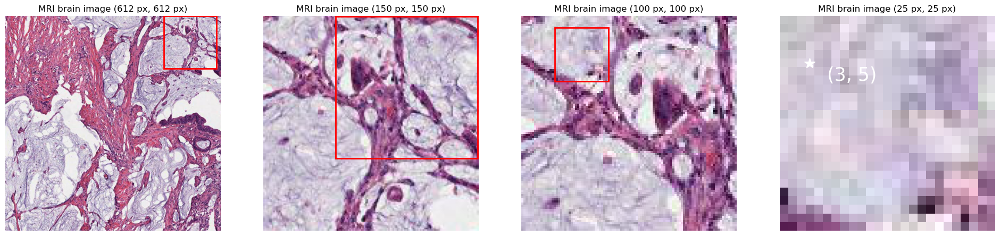

In [427]:
init = 0; inity = 600;
init2 = 0; init2y = 1050;
init3 = 0; init3y = 1050;
init4 = 5; init4y = 1065;
crops = [[init, init+612, inity, inity+612], [init2, init2+150, init2y, init2y+150], [init3, init3+100, init3y, init3y+100], [init4, init4+25, init4y, init4y+25]]
rec = [[(450, 0), 150, 150], [(50, 0), 99, 99], [(15, 5), 25, 25]]
adeno_ims = [adeno_img[a:b, c:d] for (a, b, c, d) in crops]
display_img(adeno_ims, rec)

In [31]:
# Implement the region growing algorithm

def region_growing(img, seeds, threshold):
    # Initialize the mask
    mask = np.zeros_like(img)

    # Initialize the list of pixels to be processed with multiple seeds --> not sure it's needed
    pixels_to_process = []
    for seed in seeds:
        pixels_to_process.append(seed)

    pixels_to_process = seeds
    # Process the pixels
    while len(pixels_to_process) > 0:
        # Get the first pixel from the list
        pixel = pixels_to_process.pop(0)
        # Get the pixel value
        pixel_value = img[pixel[0], pixel[1]]
        # Get the mask value
        mask_value = mask[pixel[0], pixel[1]]
        # Check if the pixel is inside the image and if it has not been processed yet
        if pixel[0] >= 0 and pixel[0] < img.shape[0] and pixel[1] >= 0 and pixel[1] < img.shape[1] and mask_value == 0:
            # Check if the pixel value is above the threshold
            if pixel_value > threshold:
                # Set the mask value to 1
                mask[pixel[0], pixel[1]] = 1
                # Add the neighboring pixels to the list
                pixels_to_process.append((pixel[0] + 1, pixel[1]))
                pixels_to_process.append((pixel[0] - 1, pixel[1]))
                pixels_to_process.append((pixel[0], pixel[1] + 1))
                pixels_to_process.append((pixel[0], pixel[1] - 1))
    return mask



In [320]:
# Implement the region growing algorithm - changed to see if works better

def region_growing(img, seeds, threshold):
    # Initialize the mask
    mask = np.zeros_like(img)

    # Initialize the list of pixels to be processed with multiple seeds --> not sure it's needed
    pixels_to_process = []
    for seed in seeds:
        pixels_to_process.append(seed)

    pixels_to_process = seeds
    # Process the pixels
    while len(pixels_to_process) > 0:
        # Get the first pixel from the list
        x, y = pixels_to_process.pop(0)
        # print(x,y)

        # Check if the pixel is inside the image 
        if x >= 0 and x < img.shape[0] and y >= 0 and y < img.shape[1]:
            # Get the pixel value
            pixel_value = img[x, y]
        
            # Get the mask value
            mask_value = mask[x, y]
            # Check if the pixel has not been processed yet and if it is above threshold
            if mask_value == 0 and pixel_value > threshold: 
                # Set the mask value to 1
                mask[x, y] = 1
                # Add the neighboring pixels to the list
                pixels_to_process.append((x + 1, y))
                pixels_to_process.append((x - 1, y))
                pixels_to_process.append((x, y + 1))
                pixels_to_process.append((x, y - 1))
                pixels_to_process.append((x + 1, y + 1))
                pixels_to_process.append((x - 1, y - 1))
                pixels_to_process.append((x + 1, y - 1))
                pixels_to_process.append((x - 1, y + 1))
                # pixels_to_process.append((x - 2, y + 2))
                # pixels_to_process.append((x + 2, y - 2))
                # pixels_to_process.append((x + 2, y + 2))
                # pixels_to_process.append((x - 2, y - 2))
                # pixels_to_process.append((x, y + 2))
                # pixels_to_process.append((x, y - 2))
                # pixels_to_process.append((x + 2, y))
                # pixels_to_process.append((x - 2, y))
                
    return mask

Je n'arrive pas à voir ou je fais faux ahah mais je pense que la fonction n'est pas bonne car vu le nombre des seeds que j'ai mises ça devrait faire plus de surface sur l'image :( snif

In [35]:
adeno_img.shape

(1401, 1269, 3)

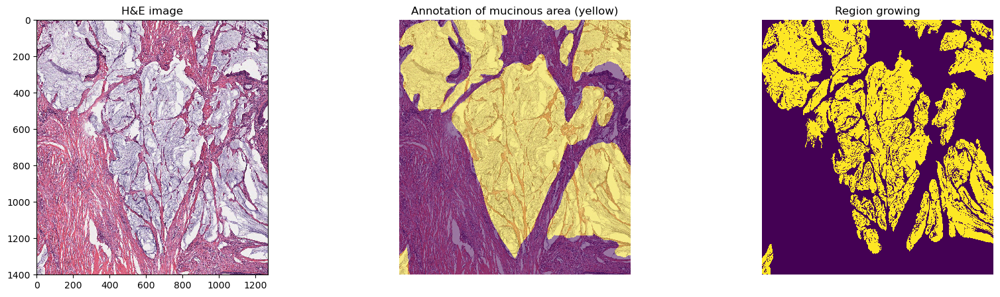

In [429]:
# Get the seeds 

#(10,10), (100,100), (500, 500), (800, 100), (1000, 800), (800, 1000), (1400, 100), (500, 1000), (1200, 1000),
# seeds = [(10,10), (100,100), (500, 500), (800, 100), (1000, 800), (800, 1000), (1400, 100), (500, 1000), (1200, 1000), (139,134)]
top_left = [(148,137), (0,400), (406,306)]
center = [(512,426), (762,758),(762,458),(557,552),(500, 1000), (875,600),(490, 840),\
          (987,667),(1050, 550), (1125,700), (1056,633), (1175, 610), (1090,550)]
top_right = [(112,1051), (240,1135), (70,860), (10,1199), (20,1150),(5,1065)]
right = [(1040,1040), (890,1150), (940,940), (1200,820)]
bottom_left =  [(1300, 10) ]
seeds = top_left + center + top_right + right + bottom_left
# Get the threshold
threshold = threshold_green

# Get the mask
mask_region = region_growing(adeno_img[:,:,1], seeds, threshold)

# Display results
fig, ax = plt.subplots(1, 3, figsize=(20, 5))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
# ax[0].axis('off')

ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')

ax[2].imshow(mask_region, interpolation='nearest')
ax[2].imshow(mask_region, alpha=0.5, interpolation='nearest')
ax[2].set_title('Region growing')
ax[2].axis('off')

plt.show()


In [434]:
error_region = 1 - (mask_region == adeno_gt).mean()

print("Error for the region growing algorithm = {}.".format(error_region))

Error for the region growing algorythm = 0.19903828684790614.


---
### 1.5 Method comparison (1pt)

In this section we display the overall outputs. Please make sure that you create the variables `mask_thesholding`, `mask_morph`, and `mask_region` to properly display the output. Comment on the results and what you think would be the best approach.

In [11]:
# Add your comments here

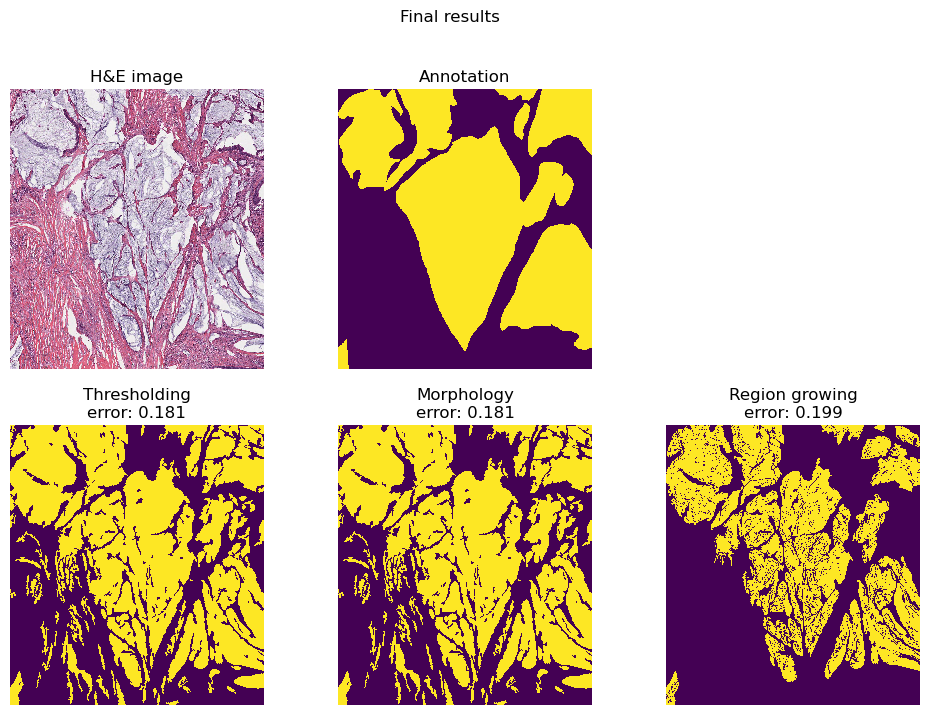

In [430]:
error_th = 1- (mask_thesholding == adeno_gt).mean()
error_morph = 1- (mask_morph == adeno_gt).mean()
error_region = 1- (mask_region == adeno_gt).mean()


# Display MRI image
fig, ax = plt.subplots(2, 3, figsize=(12, 8))

# Plot image
ax[0, 0].imshow(adeno_img, interpolation='nearest')
ax[0, 0].set_title('H&E image'.format(im_h, im_w))

# Plot image with overlay
ax[0, 1].imshow(adeno_gt, interpolation='nearest')
ax[0, 1].set_title('Annotation')

# Plot estimation using thresholding
ax[1, 0].imshow(mask_thesholding, interpolation='nearest')
ax[1, 0].set_title('Thresholding\nerror: {:.3f}'.format(error_th))

# Plot estimation using Contour detection
ax[1, 1].imshow(mask_morph, interpolation='nearest')
ax[1, 1].set_title('Morphology\nerror: {:.3f}'.format(error_morph))


# Plot estimation using Region growing
ax[1, 2].imshow(mask_region, interpolation='nearest')
ax[1, 2].set_title('Region growing\nerror: {:.3f}'.format(error_region))


[a.axis('off') for a in ax.ravel()]


plt.suptitle("Final results")
plt.show()

# ---
## Part 2: Axon segmentations (10 points)

#### Intro 

Axon segmentation is vital to neuroscience research as it enables the study of neurons' morphology and connectivity. We will conduct two exercises to evaluate the impact of your segmentation algorithms under different independent artefacts. Each exercise consists of a synthetic **Ground Truth (GT)** and two more images simulating a specific artifact.

The **Ground Truth**  has tree main compartments. 1) The inner part of the axon. 2) The outer layer of the axon (called myelin) and the extracellular space (the background of the image). 

The task consists into segmenting the three main compartments in the image to compute the inner-axon and outer-axon radii distribution.


To compute the radii, we suggest the following approximation.
$$\hat{r}_{I}= \sqrt{\frac{A_{yellow}}{\pi}}$$
$$\hat{r}_{O}= \sqrt{\frac{A_{yellow} + A_{blue}}{\pi}}$$
Where **A** is the corresponding area of the compartments. 
**Using this image as reference** 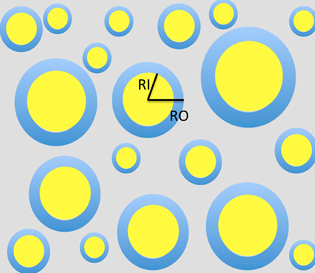

#### Artifacts simulated:

Excercise 1) Two images with different levels of SNR (signal to noise ratio). The images have rician noise.
Exercise  2) Two images aquired using a fraction of the fourier space. Only Lowest frequency are used to reconstruct the image. (simulating fast aquisitions in MRI)

Ensure your algorithm works on the GT before you go to the test cases with artifacts. Apply any preprocessing needed to the image. The preprocessing can be different for each type of image.

### Tasks

For each exercise we ask to:

1) Segment the images with the following colors: blue the inner part of the axon, red the outer part of the axon (myelin) and white for the background (example) 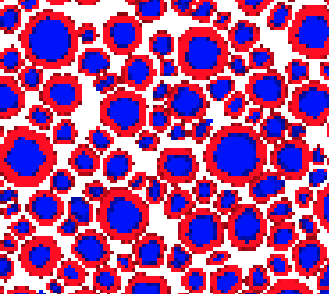

2) Count the number of axons obtained in the sample, calculate the radii for each axon, and display a radii histogram for each of the images (GT and test cases).

In the exercises, assume that each pixel side is $(0.1 \mu m)$, i.e. a pixel has an area of $(0.01 \mu m^2 )$

## Grading 
The answers does not have to be perfect, they just have to be a good approximation.

1. Developing an algorithm that works for the two GT images. **(3 points)** 
2. Use preprocessing to prepare the images with SNR and the low frequencies.  (**1 point** for SNR preprocesing , **1 point** for Low-frequency images preprocesing)
3. Running the algorithm in the test images. **1/2 point** SNR, **1/2 point** Low freqs
4. Computing and plotting radii distributions **(1 point)**
5. Explaining and discussing your implementation. **(3 points )**
    Try to be specific, not necessarily long. In the discussion include:
 1. What worked? 
 2. What did not work?
 3. Why do you think it does not work? 
 4. How could you improve your algorithms as future work?  Try to avoid general comments like "using deep learning" 
 
**Extra points: Real data example (3 points), the algorithm should display a _good enough_ segmentation.**

### 2.1 SNR

In [4]:
data_base_path

'..\\data'

..\data


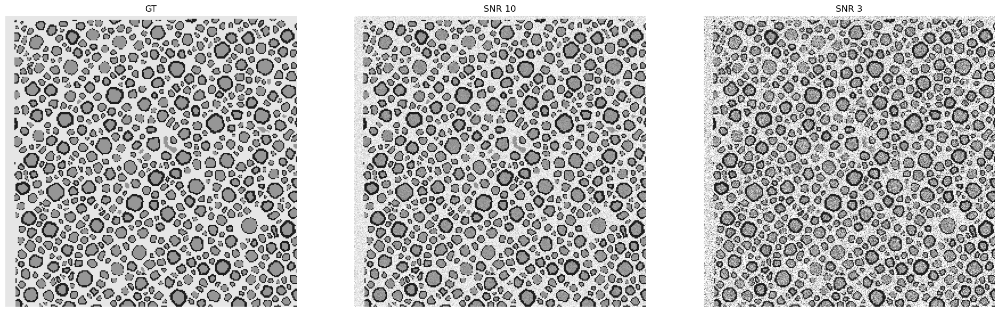

In [5]:
data_base_path = os.path.join(os.pardir, 'data')
print(data_base_path)
data_folder = 'lab-01-data'

path_folder = os.path.join(data_base_path, data_folder) + '/' 

files = ["GT_0.png"  , "test_0_0.png" , "test_0_1.png"]
gt_0 = cv2.imread(path_folder+ files[0])
snr_10 = cv2.imread(path_folder+ files[1])
snr_3 = cv2.imread(path_folder+ files[2])

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(24, 12))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.1.1 Preprocessing 

#### add your images after preprocessing


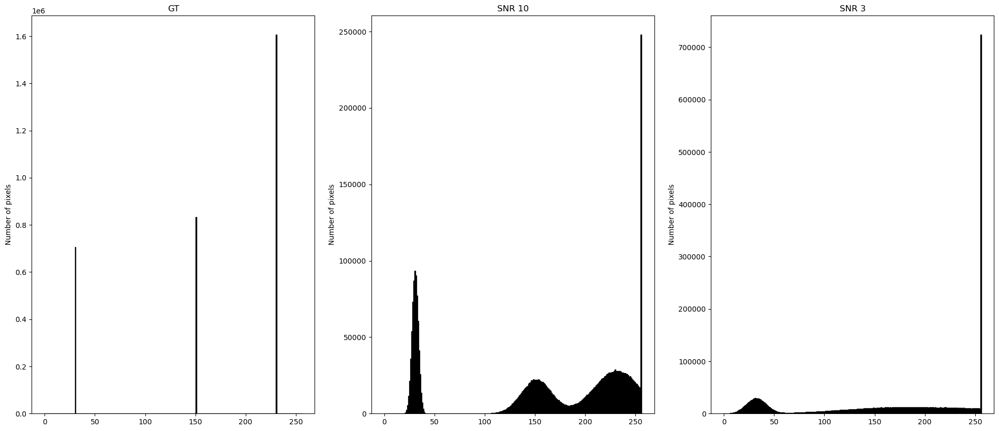

In [13]:
# First, we plot the histograms of the gray-scale images to see the pixel distribution on noisy images:
def hist_plot(images, im_names):
    fig, axes = plt.subplots(1, 3, figsize=(24, 10))
    for ax, im, nm in zip(axes.ravel(), images, im_names):
        ax.hist(im.ravel(), bins=256, range=(0, 256), fc='k', ec='k')
        ax.set_title(nm)
        ax.set_ylabel('Number of pixels')
    plt.show()

In [ ]:
hist_plot(images, im_names)

In [14]:
def display_img_task_2(imgs, titles, cmap=None):
    fig, axes = plt.subplots(1, len(imgs), figsize=(24, 12))
    for ax, im, nm in zip(axes.ravel(), imgs, titles):
        ax.imshow(im, cmap)
        ax.axis('off')
        ax.set_title(nm)
    plt.show()

In [16]:
def preprocessing(img, sigma, k):
    #function that preprocesses the image by applying a gaussian filter and a median filter to remove the noise:
    #img = filters.gaussian(img, sigma=sigma, channel_axis = -1)
    #img = sc.ndimage.median_filter(img, size=k)
    #Denoising the images with the Non-local Means Denoising algorithm:
    #img = cv2.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 21)
    #img = cv2.medianBlur(img, 5) Useful ??
    # estimate the noise standard deviation from the noisy image
    #sigma_est = np.mean(estimate_sigma(img, channel_axis=-1))
    #print(f'estimated noise standard deviation = {sigma_est}')
    # slow algorithm
    #denoise = denoise_nl_means(img, h=1.15 * sigma_est, fast_mode=False)
    denoised = denoise_nl_means(img)
    # slow algorithm, sigma provided
    #denoise2 = denoise_nl_means(img, h=0.8 * sigma_est, sigma=sigma_est,
                                #fast_mode=False)

    # fast algorithm
    #denoise_fast = denoise_nl_means(img, h=0.8 * sigma_est, fast_mode=True)

    # fast algorithm, sigma provided
    #denoise2_fast = denoise_nl_means(img, h=0.6 * sigma_est, sigma=sigma_est,
                                    #fast_mode=True)
    return denoised

In [17]:
imgs_orig = images.copy()
imgs_denoised = []
# Preprocessing the images:
for img in images: 
    imgs_denoised.append(preprocessing(img, 0.7, 3))
imgs_denoised_orig = imgs_denoised.copy()

# For display purposes, we crop the images to 256x256:
for i in range(len(imgs_denoised)):
    imgs_denoised[i] = imgs_denoised[i][0:256,0:256]
for i in range(len(images)):
    images[i] = images[i][0:256,0:256]

titles_denoised = ["GT denoised", "SNR 10 denoised", "SNR 3 denoised"]
display_img_task_2(imgs_denoised, titles_denoised, cmap = 'gray') # display the images in grayscale and cropped to 256x256
display_img_task_2(images, im_names, cmap = 'gray') # display the images in grayscale

In [ ]:
# Check if the pixel peaks are well separated after denoising:
hist_plot(imgs_denoised_orig, titles_denoised)

### 2.1.2 Results Segmentations

In [ ]:
# What is this piece of code doing??

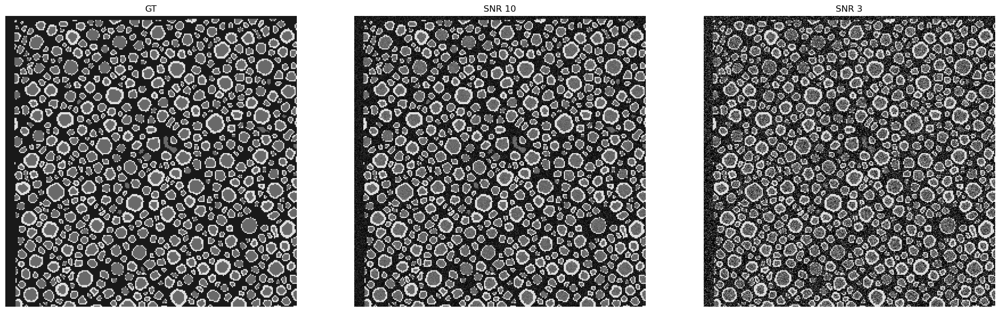

In [659]:
images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(255- im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

In [ ]:
# not necessary
# disks = [disk(size) for size in [1, 2]]

# gt_0_dilated = [opening(rgb2gray(gt_0), footprint=disk) for disk in disks]
# zoomed = [dil[0:200,0:200] for dil in gt_0_dilated]
# display_img_task_2(zoomed, ["Dilated with disk size {}".format(size) for size in [1,1.5,2]], cmap='gray')

In [90]:
def segmentation(img):
    # apply multiotsu to get the thresholds:
    thresholds = threshold_multiotsu(img)

    # create the colormap for the three classes
    colors = [(1,0,0), (0,0,1), (1,1,1)]
    cmap = LinearSegmentedColormap.from_list('Custom cmap', colors)

    # Using the threshold values, we generate the three regions.
    regions = np.digitize(img, bins=thresholds)
    return regions, cmap 

In [ ]:
# obtain grayscale images:
for i in range(len(imgs_denoised_orig)):
    imgs_denoised_orig[i] = rgb2gray(imgs_denoised_orig[i])

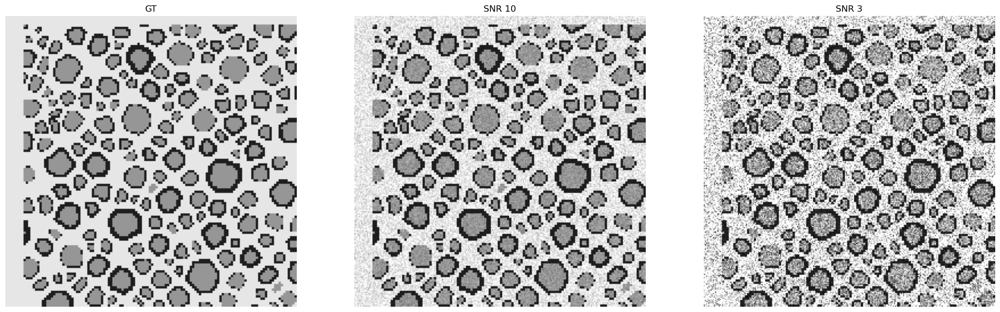

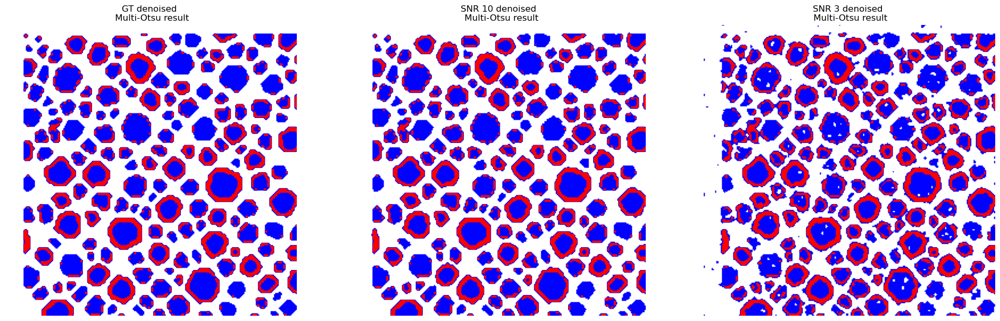

In [132]:
# Plotting the original images:
display_img_task_2(images, im_names, cmap = 'gray')

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,24))
# Plotting the Multi Otsu results:
for i in range(len(imgs_denoised_orig)):
    regions, cmap = segmentation(imgs_denoised_orig[i])
    ax[i].imshow(regions[0:256,0:256], cmap=cmap)
    ax[i].set_title(titles_denoised[i] + " \n Multi-Otsu result")
    ax[i].axis('off')

plt.subplots_adjust()
plt.show()

In [755]:
# create the colormap for the contours
from matplotlib import cm
gray_map = cm.get_cmap('gray', 256)
colors =  [(1,0,0)] + list(gray_map(np.linspace(0, 1, 256)))
cmap = LinearSegmentedColormap.from_list('Custom cmap', colors)

C:\Users\chiar\AppData\Local\Temp\ipykernel_18652\4172385004.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  gray_map = cm.get_cmap('gray', 256)


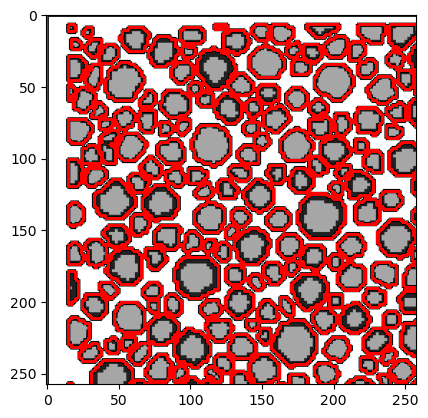

In [761]:
# TODO put in a function and insert in pipeline
# draw contours
gt_0_gray = cv2.cvtColor(gt_0, cv2.COLOR_BGR2GRAY)
rev, thresh = cv2.threshold(gt_0_gray,150,255,cv2.THRESH_BINARY)
contours,h = cv2.findContours(thresh,1,2)
new = []
for cnt in contours:
    new.append(cv2.drawContours(gt_0_gray,[cnt],-1,(0, 255, 0),2))

color_list = [(1,0,0), (0,0,1), (1,1,1)]
plt.imshow(new[0][:258,:258], cmap=cmap)

### 2.1.3 Radii histograms 

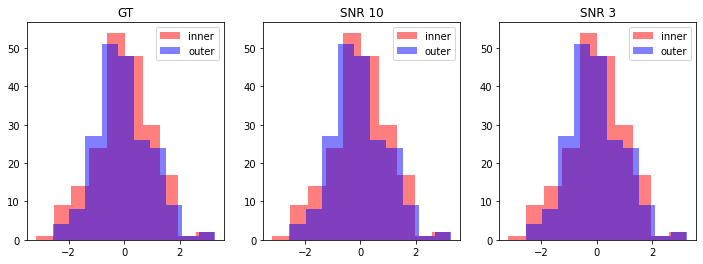

In [16]:
## results Radii distribution. proposal feel free to change it
import numpy as np


rads_outer = np.random.normal(0, 1, 200)
rads_inner = np.random.normal(0, 1, 200)


rads_gt = [ rads_inner ,rads_outer]
rads_test0 = [ rads_inner ,rads_outer]  # your result
rads_test1 = [ rads_inner ,rads_outer]  # your result

all_rads= [rads_gt , rads_test0 , rads_test1] 

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, rads, nm in zip(axes.ravel(), all_rads, im_names):
    ax.hist(rads[0]  , color = "red" , label = "inner" ,alpha= 0.5)
    ax.hist(rads[1]  , color = "blue" , label = "outer" ,alpha= 0.5)
    ax.legend()
    ax.set_title(nm)
plt.show()


### 2.2 Low frequencies

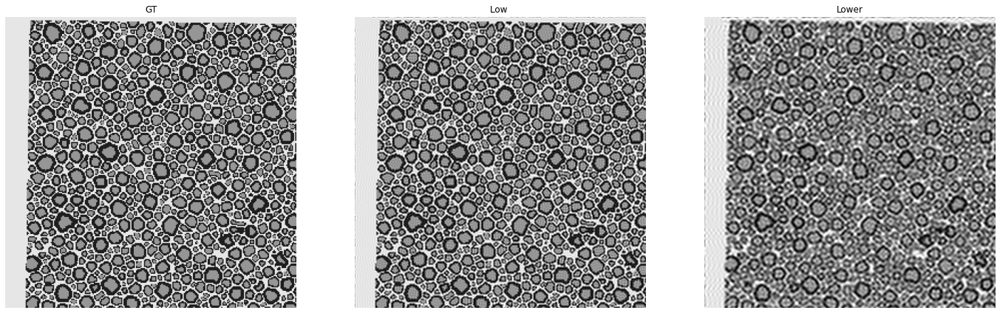

In [17]:

files = ["GT_3.png"  , "test_3_0.png" , "test_3_1.png"]
path = "data/"
gt_3 = cv2.imread(path_folder+ files[0])
lowfreq0 = cv2.imread(path_folder+ files[1])
lowfreq1 = cv2.imread(path_folder+ files[2])

images = [gt_3 , lowfreq0, lowfreq1]
im_names = ["GT" , "Low " , "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.2.1 Preprocessing

### 2.2.2 Results Segmentations

### 2.2.3 Radii histograms


### 2.5 Not mandatory exercise, Real data ( 3 points )

The points are given just by having a good enough segmentation.

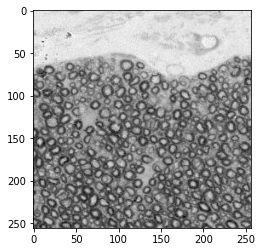

In [18]:
# Add your implementation and discussion
import cv2

files = ["extra_point.png" ]
real_data = cv2.imread(path_folder+ files[0])

plt.imshow(real_data[:256, :256])